
---

$$ \text{Classifier Model}$$

---

    1 Data Cleaning
        1.1 Remove NaNs
    2. Binary Model
        2.1 Imbalanced Classes
        2.2 Overfitting
        2.3 Precision Recall
        2.4 K-Fold Prediction
    3. Multiclass Prediction

In [1]:
import sys; sys.path.insert(1, '../pipeline/lib')
import utils, data_processing

import pandas as pd
import numpy as np

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.neighbors import NearestNeighbors
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)

import xgboost as xgb


When looking at the boxplot graphs from the [1.FirstAnalysis.ipynb](1.FirstAnalysis.ipynb) notebook we can see that the behavior of both positive classes - `1` and `2` - are similar. Those are both minority classes so let's group them and try to create a better binary classification model. This way our model can better both behaviors and we can later use the information from the binary model in our multiclass model.

# Data Cleaning

In [2]:

df_train = pd.read_csv('../../data/train-validation/training-data.csv', index_col = 0)

categorical  = ['Tipo_de_Cultivo','Tipo_de_Solo','Categoria_Pesticida', 'Temporada']
quantitative = ['Estimativa_de_Insetos', 'Semanas_Utilizando', 'Semanas_Sem_Uso']

label = 'dano_na_plantacao'

# Group labels 1 and 2
binary_label = 'dano_na_plantacao_binario'
df_train[binary_label] =  df_train[label].map({0:0,1:1,2:1}).values

# Split features and label
train_labels  = df_train[label].values
train_binary_labels = df_train[binary_label].values
df_train = df_train.iloc[:,1:]

## Remove Nans

Fill missing values base on the [2.MissingValues.ipynb](2.MissingValues.ipynb)

In [3]:
df_train.columns[df_train.isna().any()]

Index(['Semanas_Utilizando'], dtype='object')

In [4]:
train_data = data_processing.fill_missing_knn(df_train, 'Semanas_Utilizando')
train_data.isna().any()

Estimativa_de_Insetos        False
Tipo_de_Cultivo              False
Tipo_de_Solo                 False
Categoria_Pesticida          False
Doses_Semana                 False
Semanas_Utilizando           False
Semanas_Sem_Uso              False
Temporada                    False
dano_na_plantacao            False
dano_na_plantacao_binario    False
dtype: bool

# Binary Model

In [5]:
train_data[binary_label].value_counts()

0    46609
1     9391
Name: dano_na_plantacao_binario, dtype: int64

Since we already have a training-testing dataset (0.75 from original dataset) let's use 0.2 from train-test dataset for testing. 

$ 0.2 \times 0.75  = 0.15$

This way we can achieve the desired ratio:

     Complete dataset 100% -> Training-Testing 75% + Validation 15%
     
     Complete dataset 100% -> Training 75% + Testing 15% + Validation 15%
     

In [6]:
df_train_ohe = data_processing.ohe(train_data, categorical)

X_train, X_test, y_train, y_test = train_test_split(
                                        df_train_ohe.drop(columns = [label, binary_label]),
                                        df_train_ohe[binary_label],
                                        test_size=0.2,
                                        random_state=33)

In [7]:
%%time
try:
    xgb_model = xgb.XGBClassifier(objective = 'binary:logistic',
                                  tree_method = 'gpu_hist')
    xgb_model.fit(X_train, y_train)
    print('Training on GPU')
except:
    print('GPU not found!')
    xgb_model = xgb.XGBClassifier(objective = 'binary:logistic')
    xgb_model.fit(X_train, y_train)
    
preds_xgb = xgb_model.predict(X_test)
preds_xgb_proba = xgb_model.predict_proba(X_test)

Training on GPU
CPU times: user 724 ms, sys: 120 ms, total: 844 ms
Wall time: 696 ms


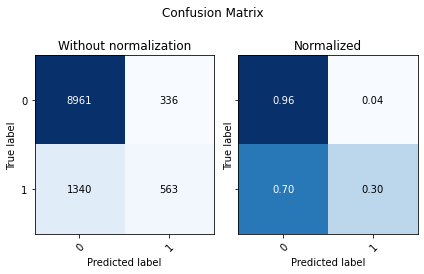

,Accuracy,F1 Score Weighted,ROC AUC
0,0.850357,0.658168,0.193485


In [8]:
display(utils.Evaluate(y_test, preds_xgb, preds_xgb_proba[:,0], ['0', '1']))

## Imbalanced classes


Let's deal with the class imbalance problem by upsampling the minority class

In [9]:
training_set = X_train.copy()
training_set[binary_label] = y_train

df_minority = training_set[training_set[binary_label] == 1]
df_majority = training_set[training_set[binary_label] == 0]
print('Minority class:',len(df_minority),'\nMajority class:', len(df_majority))

Minority class: 7488 
Majority class: 37312


In [10]:
# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=True,
                                 n_samples=46609, 
                                 random_state=33) 

# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

X_train = df_upsampled.drop(columns = [binary_label]).copy()
y_train = df_upsampled[binary_label].copy()

df_upsampled[binary_label].value_counts().to_frame()


,dano_na_plantacao_binario
1,46609
0,37312


The testing subset is still unbalanced!

In [11]:
unique, counts = np.unique(y_test, return_counts=True)
print(unique, counts/len(y_test) * 100)

[0 1] [83.00892857 16.99107143]


In [12]:
%%time

eval_set = [(X_train, y_train), (X_test, y_test)]

xgb_fit_parameters = dict(
                  eval_metric=["error", "logloss"],
                  eval_set= eval_set,
                  verbose=False
                    )

try:
    xgb_model = xgb.XGBClassifier(objective = 'binary:logistic',
                                  tree_method = 'gpu_hist')
    xgb_model.fit(X_train, y_train, **xgb_fit_parameters)
    print('Training on GPU')
except:
    xgb_model.fit(X_train, y_train, **xgb_fit_parameters)

preds_xgb = xgb_model.predict(X_test)
preds_xgb_proba = xgb_model.predict_proba(X_test)

Training on GPU
CPU times: user 2.71 s, sys: 87.6 ms, total: 2.8 s
Wall time: 840 ms


In [13]:
X_train.to_csv('x_train.csv')
y_train.to_csv('y_train.csv')
X_test.to_csv('x_test.csv')
y_test.to_csv('y_test.csv')

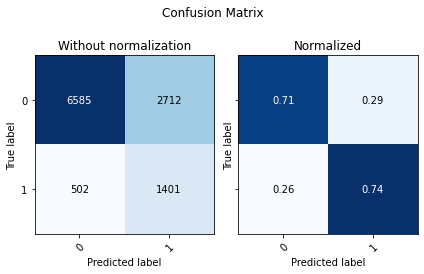

,Accuracy,F1 Score Weighted,ROC AUC
0,0.713036,0.634795,0.79984


In [14]:
display(utils.Evaluate(y_test, preds_xgb, preds_xgb_proba[:,1], ['0', '1']))

**Is overfitting occurring?**

XGBoost is famous for overfitting, let's predict on the training data. This way we can see if the model is overfitted the training data and not performing so well on new data.

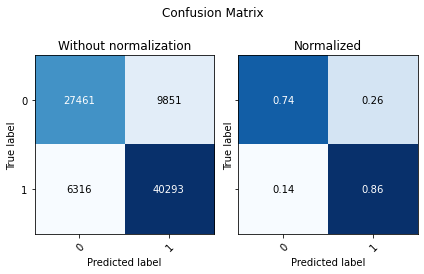

,Accuracy,F1 Score Weighted,ROC AUC
0,0.807355,0.802743,0.887432


In [15]:
# Predict on training data
preds_xgb_train = xgb_model.predict(X_train)
preds_xgb_proba_train = xgb_model.predict_proba(X_train)

display(utils.Evaluate( df_upsampled[binary_label].values, preds_xgb_train,preds_xgb_proba_train[:,1], ['0', '1']))

The training results are better than the testing results, let's look at whats going on

In [16]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
results = xgb_model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = list(range(0, epochs))
# plot log loss

fig = make_subplots()
fig.add_trace(go.Scatter(
    x = x_axis,
    y = results['validation_0']['logloss'],
    name = 'Train'
             ))
fig.add_trace(go.Scatter(
    x = x_axis,
    y = results['validation_1']['logloss'],
    name = 'Test'
             ))
fig.update_layout( title = 'log Loss', xaxis_title = 'Epochs', yaxis_title = 'Loss')
fig.show()


## Overfitting

Training on GPU


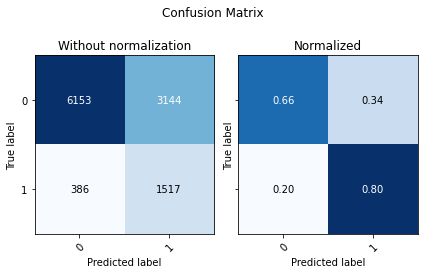

,Accuracy,F1 Score Weighted,ROC AUC
0,0.684821,0.619654,0.802329


CPU times: user 11 s, sys: 169 ms, total: 11.2 s
Wall time: 5.52 s


In [17]:
%%time

eval_set = [(X_train, y_train), (X_test, y_test)]

xgb_fit_parameters = dict(
                  eval_metric=["error", "logloss"],
                  eval_set= eval_set,
                  verbose=False
                    )

try:
    xgb_model = xgb.XGBClassifier(objective = 'binary:logistic',
                                  tree_method = 'gpu_hist',
                                  subsample = 0.4,
                                  n_estimators = 1000,
                                  colsample_bytree= 0.8, 
                                  learning_rate = 0.0001 )
    xgb_model.fit(X_train, y_train, **xgb_fit_parameters)
    print('Training on GPU')
except:
    xgb_model.fit(X_train, y_train, **xgb_fit_parameters)

preds_xgb = xgb_model.predict(X_test)
preds_xgb_proba = xgb_model.predict_proba(X_test)

display(utils.Evaluate(y_test, preds_xgb, preds_xgb_proba[:,1], ['0', '1']))


results = xgb_model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = list(range(0, epochs))

fig = make_subplots()
fig.add_trace(go.Scatter(
    x = x_axis,
    y = results['validation_0']['logloss'],
    name = 'Train'
             ))
fig.add_trace(go.Scatter(
    x = x_axis,
    y = results['validation_1']['logloss'],
    name = 'Test'
             ))
fig.update_layout( title = 'log Loss', xaxis_title = 'Iterations', yaxis_title = 'Loss')
fig.show()


## Precision Recall

Looking at the not normalized Confusion Matrix we see that our model identified a lot more of our minority classes, this comes with a downside, we are predicting a lot of false positives, and since our negative (0) class is much larger, we end up with lower accuracy.

By default models use a threshold of 0.5, we can look at the precision and recall and see if it is worth using another value. This also depends on what is important for the model, do we want to find all the minority classes even if we have lower precision, or having a higher precision and being sure the prediction of the minority class is right is better? 

In [18]:
fig = utils.plot_precision_recall(y_test, preds_xgb_proba[:,1])
fig.show()

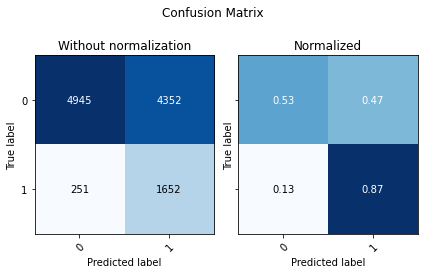

,Accuracy,F1 Score Weighted,ROC AUC
0,0.589018,0.550128,0.802329


In [19]:
threshold = 0.49
predictions = (preds_xgb_proba[:,1] > threshold).astype(int)

display(utils.Evaluate(y_test, predictions, preds_xgb_proba[:,1], ['0', '1']))

Ok so now what? We have a binary classification model that's not what we wanted! 

As we saw in the initial analysis the labels 1 and 2 seem very similar. So it's easier for our model to predict Damage (1/2) or No Damage (0) but not so trivial to differ class 1 from 2. 

Let's try to use the positive predicted class for our multi-class classification, this way our class imbalance is not so big.

## K-Fold prediction

Here we want to use predicted data to train another model, but it would be unfair if our predicted data was also used from training. So what we can do a **k-fold cross-validation prediction**, this way we can prediction on the whole training-testing dataset without predicting on training data.

**k-fold cross-validation prediction** is when we divide the dataset into k subsets and use k-1 to train the model and prediction holdout group. This is done k times alternating between subsets so that we never predict on training data and we can predict the complete dataset. 

It's important to remember that our training data also goes through some transformation - fill in missing values, one hot encoding, and upscaling -we can apply these transformations on our prediction data, but we can't apply to upscale.

In [20]:
df_train = df_train.reset_index(drop = True)

# Remove labels to predict missing values
cv_data = data_processing.fill_missing_knn(df_train.drop(columns = [label, binary_label]), 'Semanas_Utilizando')

# Insert back labels to train 
cv_data[binary_label] = df_train[binary_label]
cv_data[label] = df_train[label]
cv_data = data_processing.ohe(cv_data, categorical).reset_index(drop = True)

cv_data.head(2)

,Estimativa_de_Insetos,Doses_Semana,Semanas_Utilizando,Semanas_Sem_Uso,dano_na_plantacao_binario,dano_na_plantacao,Tipo_de_Cultivo_1,Tipo_de_Solo_1,Categoria_Pesticida_2,Categoria_Pesticida_3,Temporada_2,Temporada_3
0,2267,20,55.0,0,1,1,0,1,0,1,0,0
1,984,25,23.0,13,0,0,0,1,1,0,0,1


In [21]:
df_with_prediction = cv_data.copy()
df_with_prediction.insert(cv_data.shape[1], 'binary_prediction_proba', 0)
df_with_prediction.insert(cv_data.shape[1], 'binary_prediction', 0)

In [22]:
from sklearn.model_selection import KFold

# 5 CrossValidation Splits
kf = KFold(n_splits=5)
kf.get_n_splits(cv_data)

xbg_args = dict(
           objective = 'binary:logistic',
           tree_method = 'gpu_hist',
           subsample = 0.4,
           n_estimators = 1000,
           colsample_bytree= 0.8, 
           learning_rate = 0.0001
                )

for i, (train_index, test_index) in enumerate(kf.split(cv_data)):
    print(f'{i+1}/{kf.n_splits}: TRAIN: {len(train_index)} - TEST: {len(test_index)} ')
    
    cv_train = cv_data.iloc[train_index]
    
    X = cv_data.drop(columns = [binary_label, label])    
    X_test = X.iloc[test_index]
        
    # Upsample data
    print('Upsampling Data ...')
    df_minority = cv_train[cv_train[binary_label] == 1]
    df_majority = cv_train[cv_train[binary_label] == 0]
    n_upsample = len(df_majority)
    
    df_minority_upsampled = resample(df_minority, 
                                     replace=True,
                                     n_samples=n_upsample, 
                                     random_state=33) 
    
    # Combine majority class with upsampled minority class
    df_upsampled = pd.concat([df_majority, df_minority_upsampled])

    X_train = df_upsampled.drop(columns = [binary_label, label]).copy()
    y_train = df_upsampled[binary_label].copy()
    
    # ML Model
    print('Training Model ...')
    xgb_model = xgb.XGBClassifier( **xbg_args )
    xgb_model.fit(X_train, y_train, verbose=False)

    print('Predicting ...\n')
    
    # Predict Probability
    proba = xgb_model.predict_proba(X_test)[:,1]
    df_with_prediction.iloc[test_index, -1] = proba
    
print('Done!')

1/5: TRAIN: 44800 - TEST: 11200 
Upsampling Data ...
Training Model ...
Predicting ...

2/5: TRAIN: 44800 - TEST: 11200 
Upsampling Data ...
Training Model ...
Predicting ...

3/5: TRAIN: 44800 - TEST: 11200 
Upsampling Data ...
Training Model ...
Predicting ...

4/5: TRAIN: 44800 - TEST: 11200 
Upsampling Data ...
Training Model ...
Predicting ...

5/5: TRAIN: 44800 - TEST: 11200 
Upsampling Data ...
Training Model ...
Predicting ...

Done!


In [23]:
import joblib
#save model
filename = 'xgb_binary_classifier.xgb'
joblib.dump(xgb_model, filename) 

# #load saved model
# xgb = joblib.load(filename)

['xgb_binary_classifier.xgb']

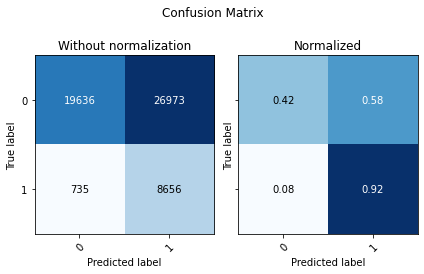

,Accuracy,F1 Score Weighted,ROC AUC
0,0.505214,0.485432,0.800882


In [24]:
threshold = 0.48

# Get classes from prediction probability
df_with_prediction['binary_prediction'] = (df_with_prediction['binary_prediction_proba'] >
                                           threshold).astype(int)

# Evaluate
fig = utils.plot_precision_recall(df_with_prediction[binary_label], 
                                  df_with_prediction['binary_prediction_proba'].values)
fig.show()

display(utils.Evaluate(df_with_prediction[binary_label],
                       (df_with_prediction['binary_prediction_proba'] > threshold).astype(int),
                       df_with_prediction['binary_prediction_proba'],
                       ['0', '1']))


In [25]:
df_wPred = df_with_prediction.drop(columns = ['binary_prediction_proba', binary_label])

# MultiClass Prediction

Now from our predicted dataframe we will split into train and testing 

In [26]:

X_train, X_test, y_train, y_test = train_test_split(
                                                    df_wPred.drop(columns = [label]), # X
                                                    df_wPred[label].values,           # Y
                                                    test_size=0.2,
                                                    random_state=33
                                                    )

train_df = X_train.copy(); train_df[label] = y_train
test_df  = X_test.copy(); test_df[label] = y_test


In [27]:

pp_train_df = train_df[train_df['binary_prediction'] == 1] # Positive predicted
np_train_df = train_df[train_df['binary_prediction'] == 0] # Negative predicted

pp_test_df = test_df[test_df['binary_prediction'] == 1] # Positive predicted
np_test_df = test_df[test_df['binary_prediction'] == 0] # Negative predicted


In [28]:
print('Positive Predicted Class Count')
display(pp_train_df[label].value_counts().to_frame() )

print('\n\n\nNegative Predicted Class Count')
display(np_train_df[label].value_counts().to_frame() )

Positive Predicted Class Count


,dano_na_plantacao
0,21570
1,5783
2,1146





Negative Predicted Class Count


,dano_na_plantacao
0,15725
1,531
2,45


Looking at both label value counts we can see in the positive predicted subset we were able to remove most of the 0 Label - we only kept 13% of the total. But we kept 50% of class 1 and 70% from class 2. 

In [29]:
pp_labels = pp_train_df[label].values

w_array = np.zeros(pp_labels.shape)


for l in np.unique(pp_labels):
    w_array[pp_labels == l] = 1- len(pp_labels[pp_labels == l])/len(pp_labels)
    
display(pd.DataFrame(zip(w_array,pp_labels), columns = ['Weights', 'Labels']).groupby('Labels').mean())

,Weights
Labels,
0,0.243131
1,0.797081
2,0.959788


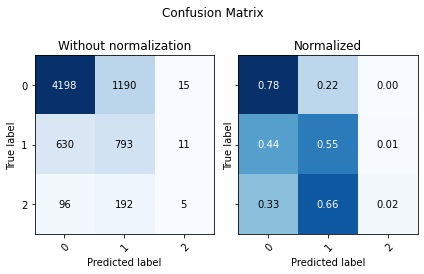

,Accuracy,F1 Score Weighted,ROC AUC
0,0.700701,0.427779,0.720175


CPU times: user 16.4 s, sys: 432 ms, total: 16.8 s
Wall time: 1.66 s


In [30]:
%%time


pp_train_X = pp_train_df.drop(columns = [label, 'binary_prediction'])
pp_train_y = pp_train_df[label].values

pp_test_X = pp_test_df.drop(columns = [label, 'binary_prediction'])
pp_test_y = pp_test_df[label].values

xgb_model = xgb.XGBClassifier(objective = 'bjective=multi:softmax',
                              tree_method = 'gpu_hist')
xgb_model.fit(pp_train_X, pp_train_y,  sample_weight = w_array)

preds_xgb = xgb_model.predict(pp_test_X)
preds_xgb_proba = xgb_model.predict_proba(pp_test_X)

preds_xgb = xgb_model.predict(pp_test_X)
preds_xgb_proba = xgb_model.predict_proba(pp_test_X)

display(utils.Evaluate(pp_test_y, preds_xgb, preds_xgb_proba, ['0', '1','2']))


In [31]:
#save model
filename = 'xgb_multilabel_classifier.xgb'
joblib.dump(xgb_model, filename) 

['xgb_multilabel_classifier.xgb']

In [32]:
pd.DataFrame(list(zip(preds_xgb_proba[:,0],preds_xgb_proba[:,1],preds_xgb_proba[:,2],  preds_xgb)), 
             columns= ['Proba 0','Proba 1', 'Proba 2','Class Pred'])

,Proba 0,Proba 1,Proba 2,Class Pred
0,0.101900,0.549280,0.348820,1
1,0.226323,0.400158,0.373519,1
2,0.916526,0.076652,0.006822,0
3,0.333894,0.529902,0.136205,1
4,0.323089,0.662145,0.014766,1
...,...,...,...,...
7125,0.349980,0.581073,0.068946,1
7126,0.863426,0.134723,0.001851,0
7127,0.580020,0.412889,0.007091,0
7128,0.635819,0.314860,0.049321,0


Remember, here we are just working with a subset from our dataframe which the binary classifier predicted a positive class (1). So we can adjust the threshold to try to bring our confusion matrix to the right (1 or 2), any false negatives we have here is not a problem since it's a small percentage from the complete data.

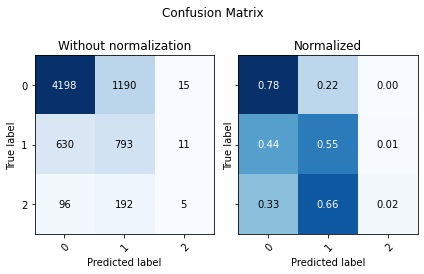

,Accuracy,F1 Score Weighted,ROC AUC
0,0.700701,0.427779,0.720175


In [33]:
display(utils.Evaluate(pp_test_y, preds_xgb, preds_xgb_proba, ['0', '1','2']))

In [34]:

try:
    np_test_df.insert(np_test_df.shape[1], 'MultiClass_Prediction', 0 )
    pp_test_df.insert(pp_test_df.shape[1], 'MultiClass_Prediction', preds_xgb )
    pp_test_df.insert(pp_test_df.shape[1], 'MultiClass_ProbaPrediction_0', preds_xgb_proba[:,0] )
    pp_test_df.insert(pp_test_df.shape[1], 'MultiClass_ProbaPrediction_1', preds_xgb_proba[:,1] )
    pp_test_df.insert(pp_test_df.shape[1], 'MultiClass_ProbaPrediction_2', preds_xgb_proba[:,2] )
except ValueError:
    np_test_df['MultiClass_Prediction'] = 0
    pp_test_df['MultiClass_Prediction'] = preds_xgb
    
    pp_test_df['MultiClass_ProbaPrediction_0'] = preds_xgb_proba[:,0]
    pp_test_df['MultiClass_ProbaPrediction_1'] = preds_xgb_proba[:,1]
    pp_test_df['MultiClass_ProbaPrediction_2'] = preds_xgb_proba[:,2]


In [35]:
df_evaluate = pd.concat([np_test_df, pp_test_df])

In [36]:
df_evaluate['MultiClass_ProbaPrediction_0'] = df_evaluate['MultiClass_ProbaPrediction_0'].fillna(1)
df_evaluate['MultiClass_ProbaPrediction_1'] = df_evaluate['MultiClass_ProbaPrediction_1'].fillna(0)
df_evaluate['MultiClass_ProbaPrediction_2'] = df_evaluate['MultiClass_ProbaPrediction_2'].fillna(0)

In [37]:
pred_proba = df_evaluate[['MultiClass_ProbaPrediction_0',
                          'MultiClass_ProbaPrediction_1',
                          'MultiClass_ProbaPrediction_2']].values

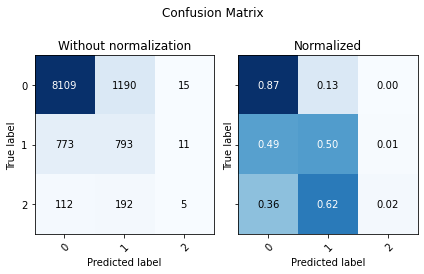

,Accuracy,F1 Score Weighted,ROC AUC
0,0.795268,0.445987,0.784457


In [38]:
display(utils.Evaluate(df_evaluate[label], 
                       df_evaluate['MultiClass_Prediction'], 
                       pred_proba, 
                       ['0', '1','2']))